In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [2]:
df = pd.read_csv("07_flats_EDA.csv")

In [3]:
df.shape

(2911, 32)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2911 entries, 0 to 2910
Data columns (total 32 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   price_cr                2904 non-null   float64
 1   area_sqm                2911 non-null   float64
 2   bhk                     2911 non-null   int64  
 3   bathroom                2911 non-null   int64  
 4   balcony                 2911 non-null   int64  
 5   addl_room               2911 non-null   int64  
 6   sector                  2911 non-null   int64  
 7   landmark_count          2911 non-null   int64  
 8   has_hospital_or_clinic  2911 non-null   int64  
 9   has_police_stn          2911 non-null   int64  
 10  has_fire_stn            2911 non-null   int64  
 11  has_mall                2911 non-null   int64  
 12  has_market              2911 non-null   int64  
 13  has_park                2911 non-null   int64  
 14  has_bank_or_atm         2911 non-null   

In [5]:
df.head(2)

,price_cr,area_sqm,bhk,bathroom,balcony,addl_room,sector,landmark_count,has_hospital_or_clinic,has_police_stn,...,has_temple_or_church,has_famous_chowk,has_club,has_stadium,has_restro_cafe,area_type,floor_rise,age,society,city
0,0.45,83.61,2,2,1,0,7,50,34,0,...,1,0,0,0,1,carpet,mid,new,maa bhagwati residency,gurgaon
1,0.50,60.39,2,2,1,0,3,48,4,0,...,2,0,0,0,0,carpet,low,old,apna enclave,gurgaon


In [6]:
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
price_cr,2904.0,NaN,NaN,NaN,1.729607,1.406123,0.16,0.9,1.4,2.09,15.0
area_sqm,2911.0,NaN,NaN,NaN,255.48643,2117.57303,6.69,120.77,161.19,199.74,68483.2
bhk,2911.0,NaN,NaN,NaN,2.810374,0.791129,1.0,2.0,3.0,3.0,6.0
bathroom,2911.0,NaN,NaN,NaN,2.967365,1.045018,1.0,2.0,3.0,4.0,7.0
balcony,2911.0,NaN,NaN,NaN,2.460666,0.789372,0.0,2.0,3.0,3.0,3.0
addl_room,2911.0,NaN,NaN,NaN,0.576434,0.494208,0.0,0.0,1.0,1.0,1.0
sector,2911.0,NaN,NaN,NaN,70.537616,28.826174,1.0,51.0,78.0,91.0,142.0
landmark_count,2911.0,NaN,NaN,NaN,14.299897,11.384368,3.0,9.0,10.0,14.0,50.0
has_hospital_or_clinic,2911.0,NaN,NaN,NaN,2.272415,4.712307,0.0,1.0,1.0,1.0,42.0
has_police_stn,2911.0,NaN,NaN,NaN,0.014772,0.120658,0.0,0.0,0.0,0.0,1.0


In [7]:
df.columns

Index(['price_cr', 'area_sqm', 'bhk', 'bathroom', 'balcony', 'addl_room',
       'sector', 'landmark_count', 'has_hospital_or_clinic', 'has_police_stn',
       'has_fire_stn', 'has_mall', 'has_market', 'has_park', 'has_bank_or_atm',
       'has_institute', 'has_airport', 'has_rly_stn', 'has_metro_stn',
       'has_expy', 'has_petrol_pump', 'has_hotel', 'has_temple_or_church',
       'has_famous_chowk', 'has_club', 'has_stadium', 'has_restro_cafe',
       'area_type', 'floor_rise', 'age', 'society', 'city'],
      dtype='object')

In [8]:
df.isnull().sum()

price_cr                  7
area_sqm                  0
bhk                       0
bathroom                  0
balcony                   0
addl_room                 0
sector                    0
landmark_count            0
has_hospital_or_clinic    0
has_police_stn            0
has_fire_stn              0
has_mall                  0
has_market                0
has_park                  0
has_bank_or_atm           0
has_institute             0
has_airport               0
has_rly_stn               0
has_metro_stn             0
has_expy                  0
has_petrol_pump           0
has_hotel                 0
has_temple_or_church      0
has_famous_chowk          0
has_club                  0
has_stadium               0
has_restro_cafe           0
area_type                 0
floor_rise                0
age                       0
society                   0
city                      0
dtype: int64

In [9]:
df.dropna(inplace=True)

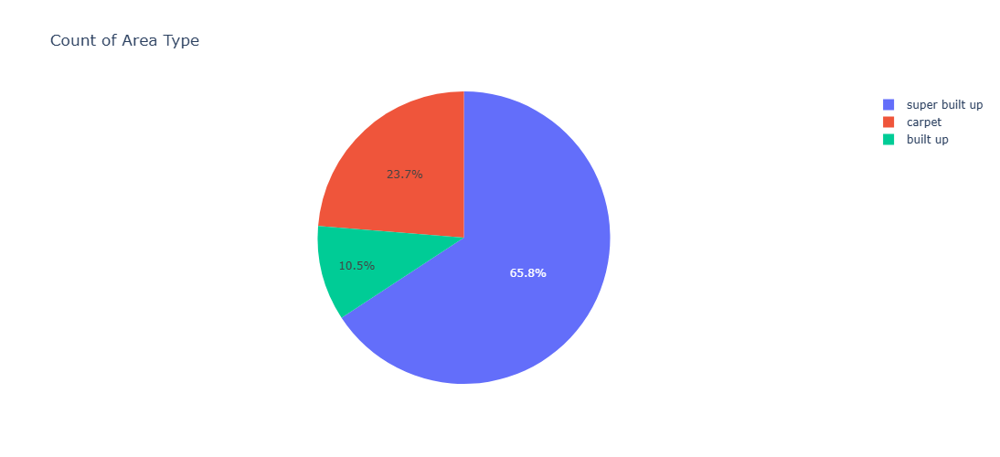

In [10]:
px.pie(df, names='area_type', title='Count of Area Type', height=500)

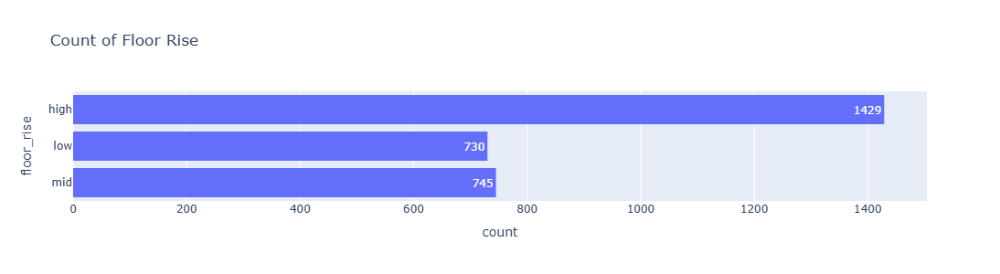

In [11]:
px.histogram(df, y='floor_rise', title='Count of Floor Rise', text_auto=True, height=300)

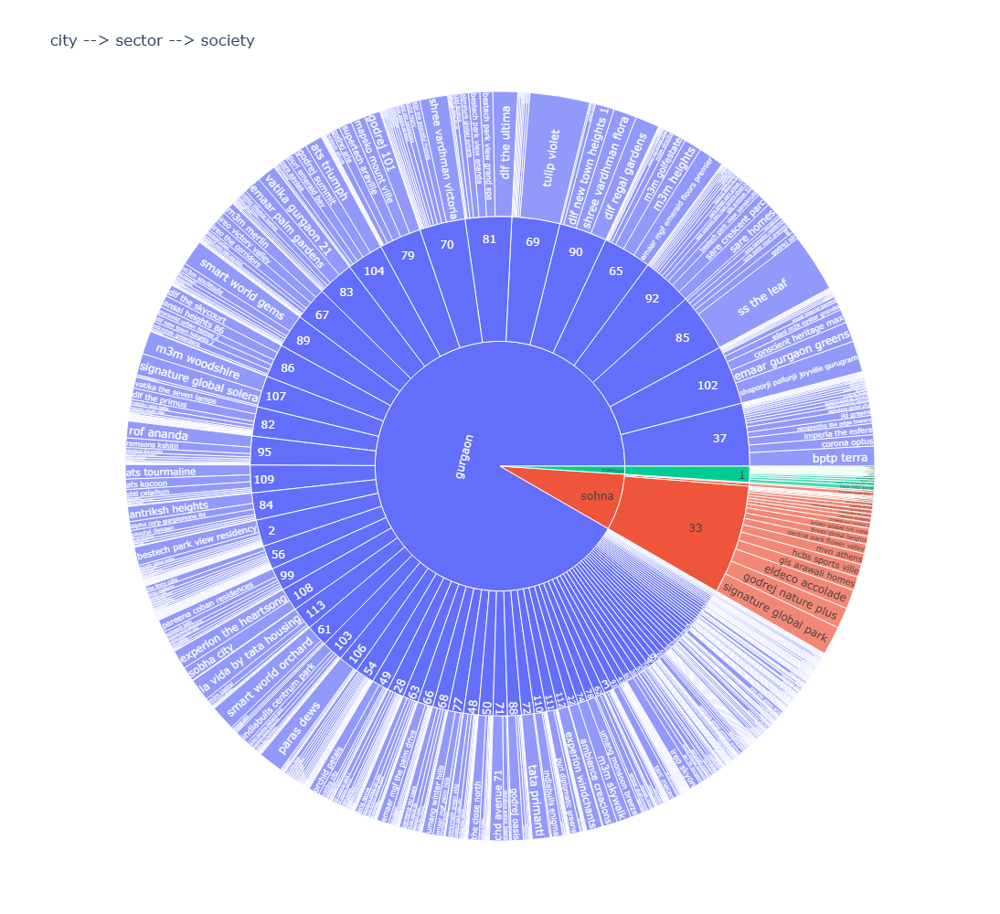

In [12]:
px.sunburst(df, path=["city", "sector", "society"], title='city --> sector --> society', color='city', height=1000)

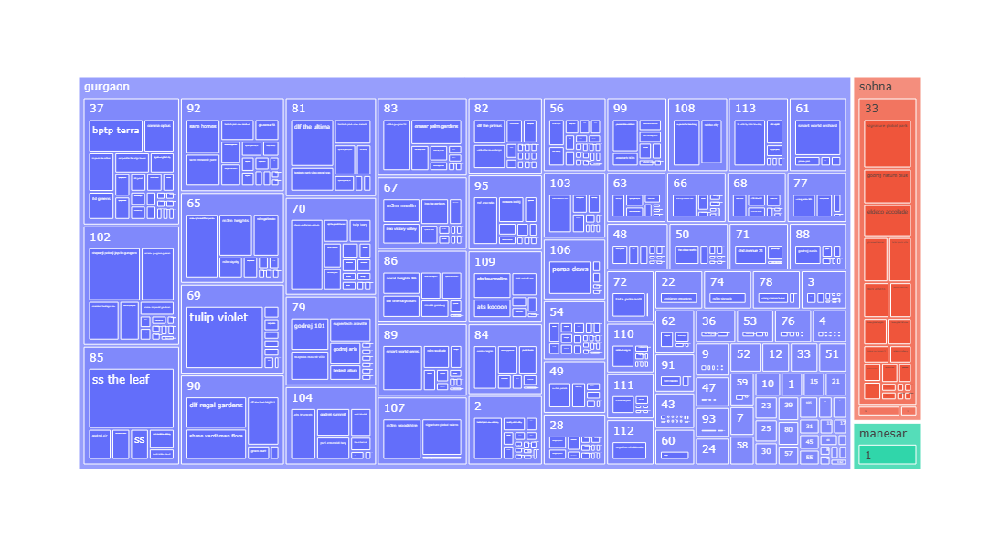

In [13]:
px.treemap(df, 
           path=["city", "sector", "society"], 
           height=600
)

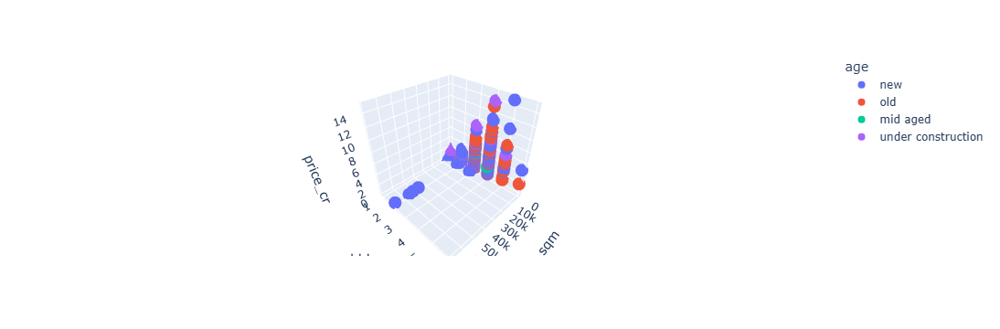

In [16]:
px.scatter_3d(df,
                x='area_sqm',
                y='bhk',
                z='price_cr',
                log_y=False,
                color='age',
                hover_name='society')

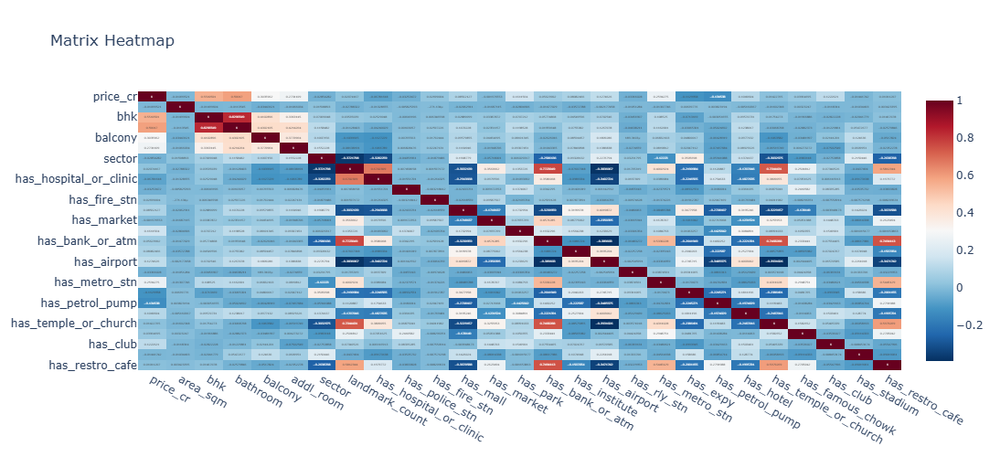

In [40]:
fig = px.imshow(df.corr(numeric_only=True),
                text_auto=True,
                color_continuous_scale="RdBu_r",
                aspect="auto",
                title="Matrix Heatmap",
               height=500,
               width=1000)
fig.show()

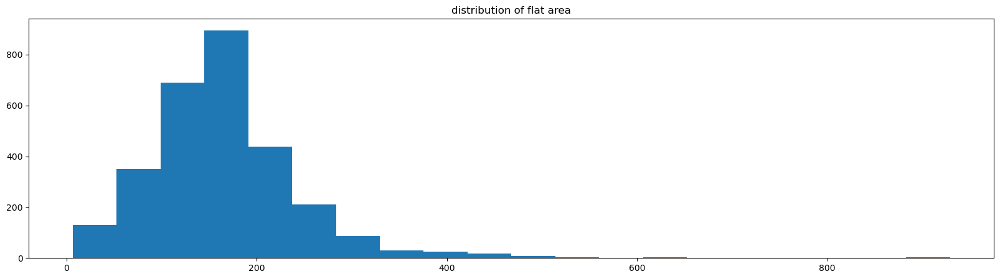

In [54]:
plt.figure(figsize=(20,5))
plt.hist(x=df[df['area_sqm']<1000]['area_sqm'], bins=20, log=False)
plt.title("distribution of flat area")
plt.show()

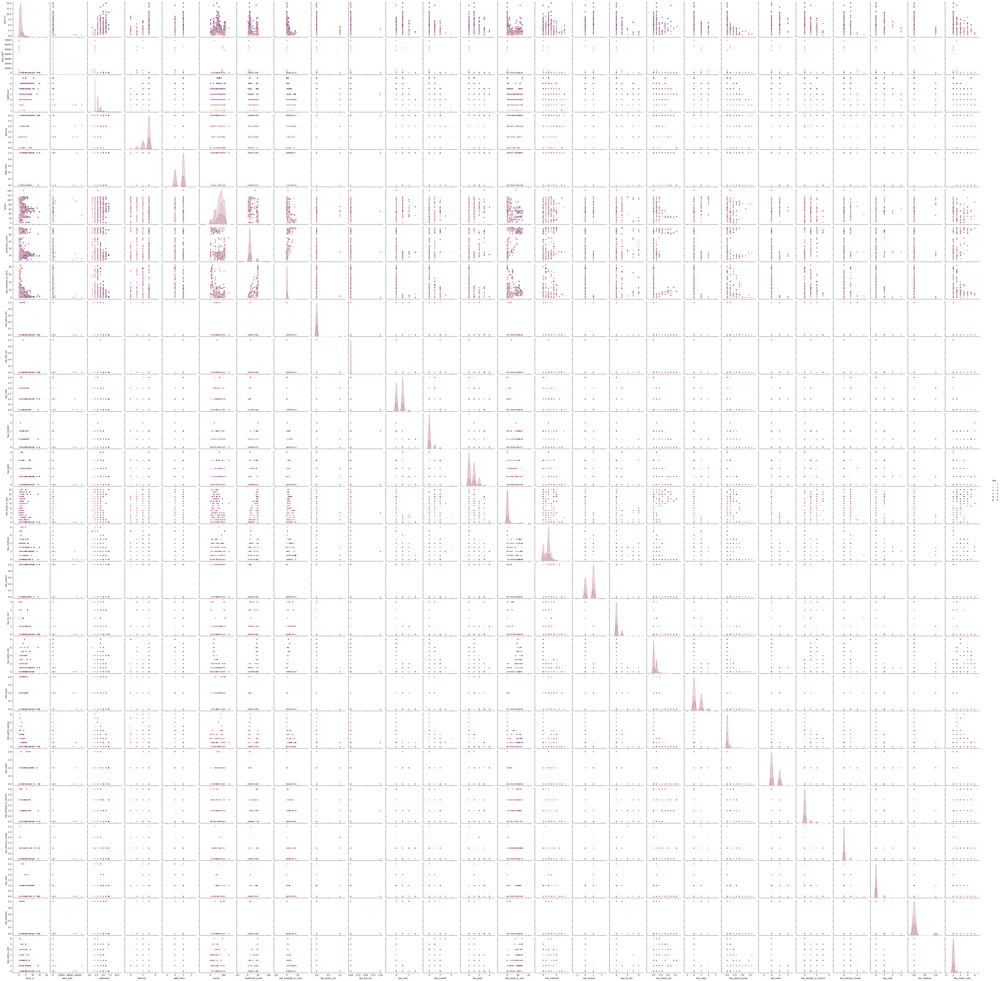

In [62]:
sns.pairplot(df,hue='bhk')